## CW parameter estimation with discovery and numpyro

Obviously, `discovery.samplers.numpyro` requires `numpyro`.

In [1]:
import sys
import os
import glob

import tqdm

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pp

%matplotlib inline

In [3]:
import jax
jax.config.update('jax_enable_x64', True)

import jax.random
import jax.numpy as jnp

In [4]:
import discovery as ds
import discovery.models.nanograv as ds_nanograv
import discovery.samplers.numpyro as ds_numpyro

In [159]:
import importlib
importlib.reload(ds.signals)
importlib.reload(ds.pulsar)
importlib.reload(ds.deterministic)
importlib.reload(ds.matrix)
importlib.reload(ds)

<module 'discovery' from '/Users/vallis/Documents/discovery/src/discovery/__init__.py'>

Load EPTA DR2 data

In [33]:
allpsrs = [ds.Pulsar.read_feather(psrfile) for psrfile in sorted(glob.glob('../data/epta_dr2/*.feather'))]

We'll use only five pulsars for speed.

In [34]:
psrs = allpsrs[0:5]

Currently `ds.delay_binary` takes `dec` and `inc`, but `sindec` and `cosinc` respectively have uniform priors and are easier to sample without writing special code. So we make a factory to make a JAX delay function with those.

**Note also that the CW code is beta quality so I don't guarantee that all the conventions are right.**

The standard EPTA model can be created with functions in `discovery.models.epta`, but here we use a nanograv-style model so we can add the delay. Enable `globalgp` to get HD GW.

In [233]:
import importlib
importlib.reload(ds.signals)
importlib.reload(ds.pulsar)
importlib.reload(ds.deterministic)
importlib.reload(ds.matrix)
importlib.reload(ds.likelihood)
importlib.reload(ds)

<module 'discovery' from '/Users/vallis/Documents/discovery/src/discovery/__init__.py'>

In [234]:
fourdelay = ds.makefourier_binary(pulsarterm=True)
cwcommon = ['cw_sindec', 'cw_cosinc', 'cw_log10_f0', 'cw_log10_h0', 'cw_phi_earth', 'cw_psi', 'cw_ra']

T = ds.getspan(psrs)
fml = ds.ArrayLikelihood([ds.PulsarLikelihood([psr.residuals,
                                               ds.makenoise_measurement(psr, noisedict=psr.noisedict),
                                               # ds.makegp_ecorr(psr, noisedict=psr.noisedict),
                                               ds.makegp_timing(psr, svd=True),
                                              ]) for psr in psrs],
                         commongp = ds.makecommongp_fourier(psrs, ds.makepowerlaw_crn(14), 30, T, means=fourdelay,
                                                            common=['crn_gamma', 'crn_log10_A'] + cwcommon, name='rednoise', meansname='cw'))

In [235]:
logl = fml.logL

Got <function makecommongp_fourier.<locals>.meanfunc at 0x436c131a0>


In [213]:
logl.params

['J0030+0451_cw_phi_psr',
 'J0030+0451_rednoise_gamma',
 'J0030+0451_rednoise_log10_A',
 'J0613-0200_cw_phi_psr',
 'J0613-0200_rednoise_gamma',
 'J0613-0200_rednoise_log10_A',
 'J0751+1807_cw_phi_psr',
 'J0751+1807_rednoise_gamma',
 'J0751+1807_rednoise_log10_A',
 'J0900-3144_cw_phi_psr',
 'J0900-3144_rednoise_gamma',
 'J0900-3144_rednoise_log10_A',
 'J1012+5307_cw_phi_psr',
 'J1012+5307_rednoise_gamma',
 'J1012+5307_rednoise_log10_A',
 'crn_gamma',
 'crn_log10_A',
 'cw_cosinc',
 'cw_log10_f0',
 'cw_log10_h0',
 'cw_phi_earth',
 'cw_psi',
 'cw_ra',
 'cw_sindec']

In [227]:
p0 = ds.sample_uniform(logl.params)

In [237]:
logl(p0)

Array(211066.71212869, dtype=float64)

In [232]:
logl(p0)

Array(211066.71212869, dtype=float64)

In [142]:
timedelay = ds.makedelay_binary(pulsarterm=True)
fourdelay = ds.makefourier_binary(pulsarterm=True)

cwcommon = ['cw_sindec', 'cw_cosinc', 'cw_log10_f0', 'cw_log10_h0', 'cw_phi_earth', 'cw_psi', 'cw_ra']

T = ds.getspan(psrs)

tml = ds.ArrayLikelihood([ds.PulsarLikelihood([psr.residuals,
                                               ds.makenoise_measurement(psr, noisedict=psr.noisedict),
                                               # ds.makegp_ecorr(psr, noisedict=psr.noisedict),
                                               ds.makegp_timing(psr, svd=True),
                                               ds.makedelay(psr, timedelay, common=cwcommon, name='cw')
                                              ]) for psr in psrs],
                          commongp = ds.makecommongp_fourier(psrs, ds.powerlaw, 30, T, name='rednoise'),
                          globalgp = ds.makeglobalgp_fourier(psrs, ds.powerlaw, ds.hd_orf, 14, T, name='gw'))

fml = ds.ArrayLikelihood([ds.PulsarLikelihood([psr.residuals,
                                               ds.makenoise_measurement(psr, noisedict=psr.noisedict),
                                               # ds.makegp_ecorr(psr, noisedict=psr.noisedict),
                                               ds.makegp_timing(psr, svd=True),
                                              ]) for psr in psrs],
                          commongp = ds.makecommongp_fourier(psrs, ds.powerlaw, 30, T, name='rednoise'),
                          globalgp = ds.makeglobalgp_fourier(psrs, ds.powerlaw, ds.hd_orf, 14, T, means=fourdelay, common=cwcommon, name='gw', meansname='cw'))

Random parameters.

In [134]:
p0 = ds.sample_uniform(tml.logL.params)

Sanity check---the likelihood runs fine.

In [135]:
tml.logL(p0), fml.logL(p0)

(Array(210928.53474875, dtype=float64), Array(210928.53500341, dtype=float64))

Let's see what the CW is doing in the first pulsar.

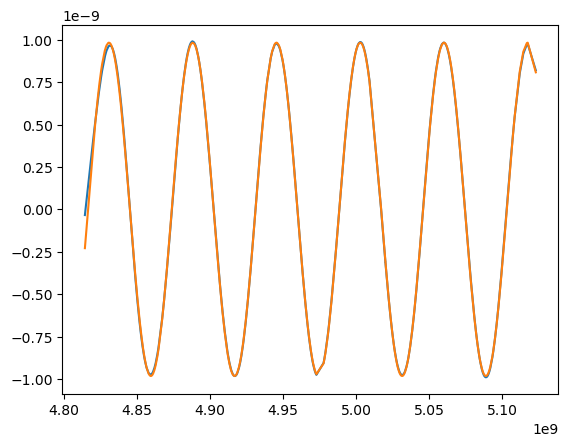

In [136]:
pp.plot(psrs[0].toas, ml.globalgp.Fs[0] @ fml.globalgp.means(p0)[:28])
pp.plot(psrs[0].toas, ds.makedelay(psrs[0], timedelay, name='cw', common=cwcommon)(p0))

Prepare transformed likelihood and model for numpyro.

In [137]:
flogl = ds_numpyro.makemodel_transformed(fml.logL)

In [138]:
sampler = ds_numpyro.makesampler_nuts(flogl)

Run!

In [ ]:
sampler.run(jax.random.PRNGKey(42))

Let's see a plot. Not very significant of course with few pulsars and no HD correlations.

In [288]:
chain = sampler.to_df()

In [289]:
import corner

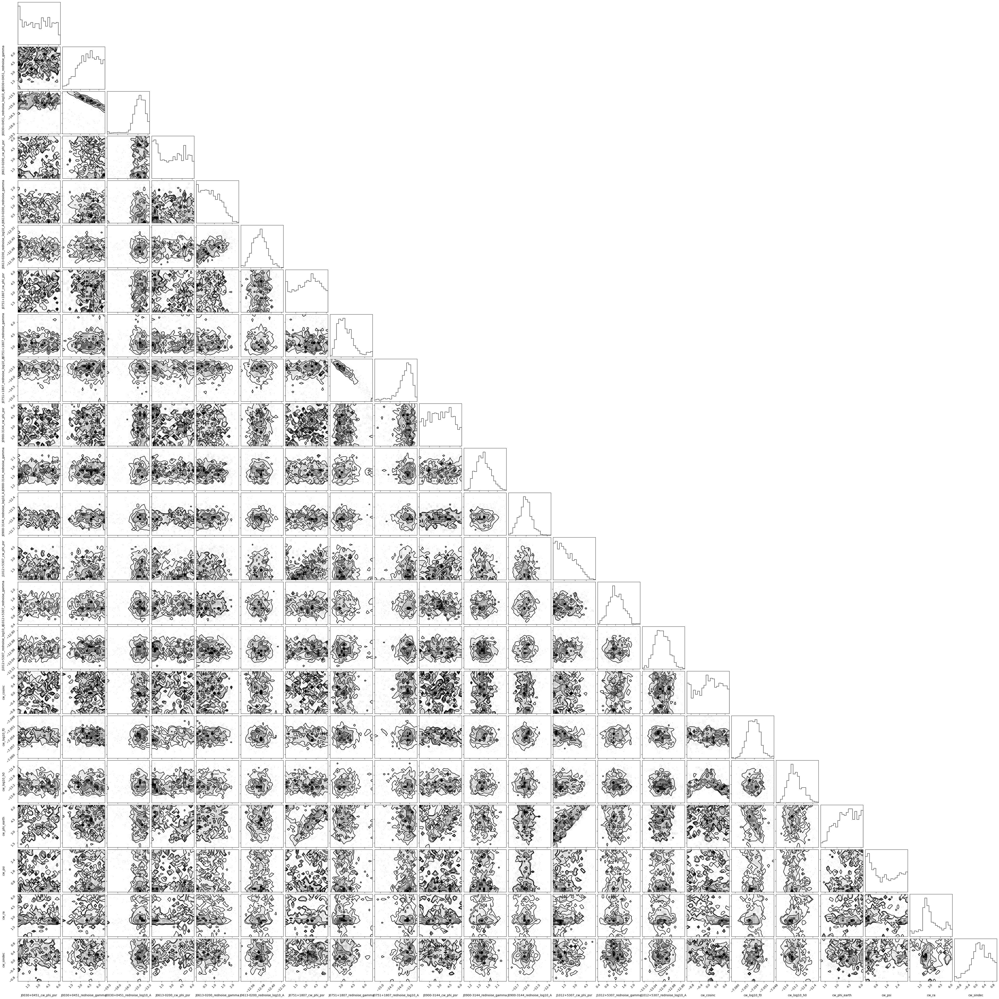

In [290]:
fig = corner.corner(chain.values, labels=chain.columns)